In [1]:
import pandas as pd
from glob import glob

In [2]:
dfs = []
dfs_raw = []
for f in glob("/home/amueller/winhome/Downloads/2015-citibike-tripdata/2015-citibike-tripdata/*/*.csv"):
    df = pd.read_csv(f, parse_dates=['starttime'])
    dfs_raw.append(df)
    dfs.append(df.groupby(['starttime', 'start station id']).size().unstack("start station id").resample("1h").sum())

In [3]:
all_df = pd.concat(dfs).sort_index()

In [4]:
all_df.shape

(8765, 488)

In [5]:
all_df

start station id,72,79,82,83,116,119,120,127,137,143,...,349,404,431,464,255,3014,3016,3181,3182,3133
starttime,,,,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 01:00:00,0.0,0.0,0.0,0.0,3.0,0.0,2.0,1.0,0.0,0.0,...,0.0,2.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 02:00:00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,...,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 03:00:00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,1.0,2.0,0.0,0.0,4.0,0.0,4.0,5.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-12-31 20:00:00,0.0,2.0,0.0,4.0,3.0,0.0,0.0,3.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-12-31 21:00:00,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# once csv per station

In [7]:
bla = all_df_raw.groupby(["start station id", 'start station name']).size()

NameError: name 'all_df_raw' is not defined

In [ ]:
station_id_dict = bla.reset_index().set_index("start station name")["start station id"].to_dict()

In [8]:
for col in all_df:
    all_df[col].dropna().rename('value').to_csv(f"citibike_aggregated/{col}.csv")

In [174]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import acf
from scipy.signal import find_peaks, peak_prominences, peak_widths
from scipy import stats


def check_even_fractions(peak_idx, peaks):
    peak = peaks[peak_idx]
    for divisor in [2, 3]:
        if peak % divisor == 0:
            new_peak_idx = np.where(peaks == peak // divisor)[0]
            if len(new_peak_idx):
                peak_idx = new_peak_idx[0]
                peak = peaks[peak_idx]
    return peak_idx

def find_two_lengths(data, n_lags=5000, peak_threshold1=0.01, peak_threshold2=0.1):
    a, b = np.quantile(data, [0.001, 0.999])
    data_clipped = np.clip(data, a, b)
    auto_corr = acf(data, nlags=n_lags, fft=True)
    peaks, _ = find_peaks(auto_corr)
    prominences = peak_prominences(auto_corr, peaks)[0]

    if not len(prominences):
        return 0, 0

    masked_inds = np.where(auto_corr[peaks] >= np.maximum.accumulate(auto_corr[peaks][::-1])[::-1])[0]
    result_ind = masked_inds[0]
    result = peaks[result_ind]
    if result < 3:
        result_ind = masked_inds[1]
        result = peaks[result_ind]
    second_res_ind = np.argmax(prominences[masked_inds])
    second_res = peaks[masked_inds[second_res_ind]]
    second_res_prominence = prominences[second_res_ind]

    if second_res == result and result_ind > 1:
        # the first non-dominated peak is also the most prominent peak
        # that likely means any secondary periodicity is dominated by that peak, so smaller than it.
        # so we pick the most prominent peak that's smaller than the found peak
        second_res_ind = np.argmax(prominences[:result_ind])
        second_res_ind = check_even_fractions(second_res_ind, peaks)
        second_res = peaks[second_res_ind]
        
    if prominences[result_ind] < peak_threshold1:
        result = 0
    if second_res == result or second_res_prominence < peak_threshold2:
        second_res = 0
        
    return result, second_res

In [175]:
periods = {}
for col in all_df:
    periods[col] = find_two_length(all_df[col].fillna(0))
periods = pd.DataFrame(periods).T

In [176]:
datasets = []
for col in all_df:
    df = all_df[col]
    first, second = find_two_lengths(df)
    auto_corr = acf(df, nlags=5000, fft=True)
    datasets.append([df, first, auto_corr[first], second, auto_corr[second], col])    

In [177]:
periods = pd.DataFrame([x[1:] for x in datasets], columns=["first", "ac_first", "second", "ac_second", 'name'])

In [178]:
periods[['first', 'second']].value_counts()

first  second
0      0         187
168    0         136
       24         95
24     168        32
168    12         17
24     0          12
168    336         3
24     336         2
168    23          1
336    0           1
       24          1
       84          1
Name: count, dtype: int64

In [179]:
periods[['first', 'second']].melt()['value'].value_counts()

value
0      523
168    284
24     142
12      17
336      8
84       1
23       1
Name: count, dtype: int64

In [180]:
periods['first'].value_counts()

first
168    252
0      187
24      46
336      3
Name: count, dtype: int64

In [181]:
periods['second'].value_counts()

second
0      336
24      96
168     32
12      17
336      5
84       1
23       1
Name: count, dtype: int64

In [182]:
interesting = periods[~periods['second'].isin([168, 24, 0])].index

/tmp/ipykernel_32160/3669490651.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 5))


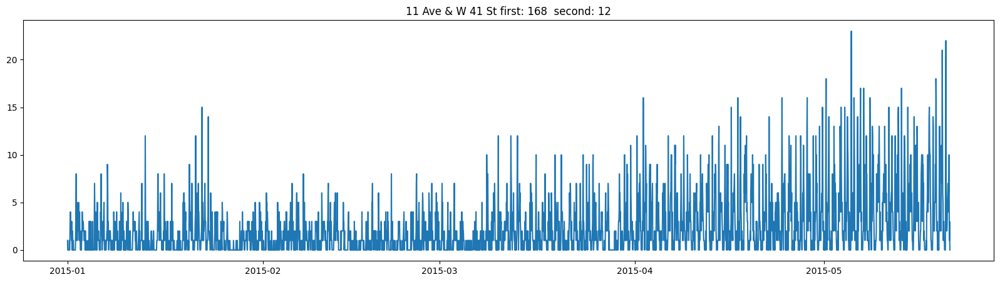

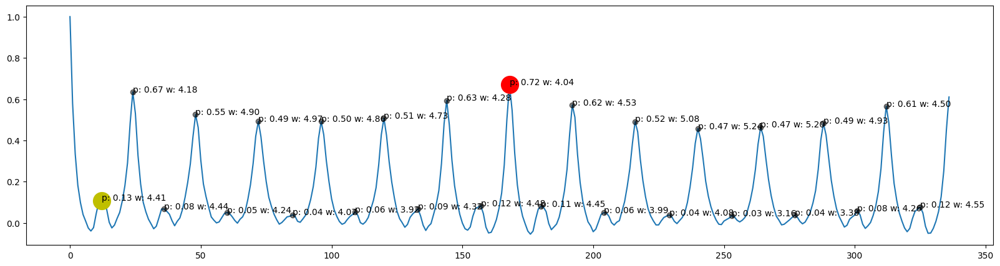

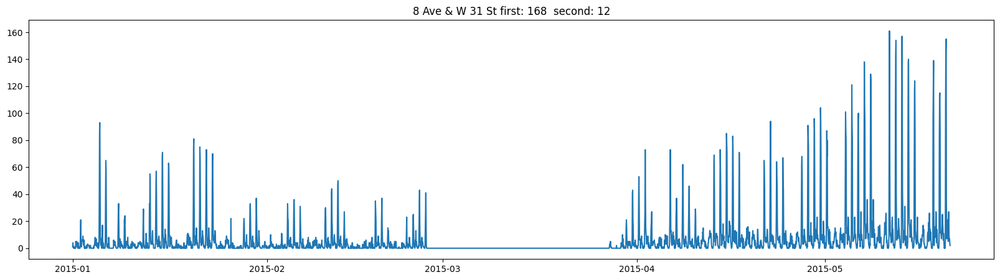

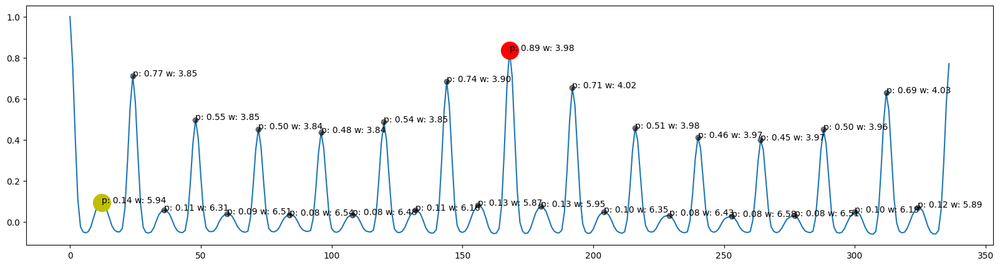

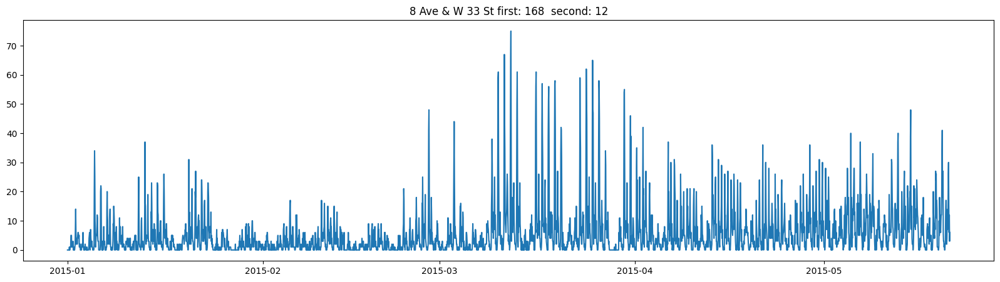

...

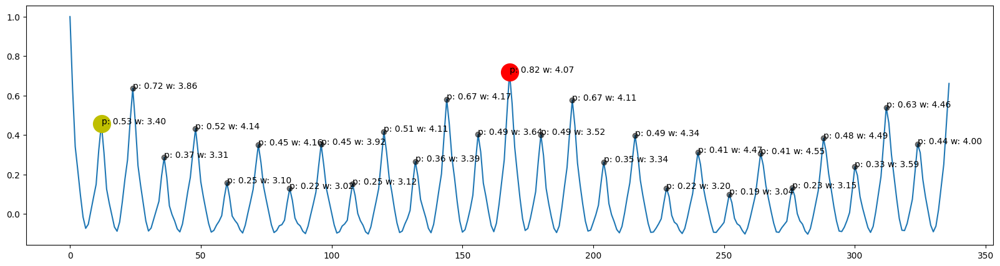

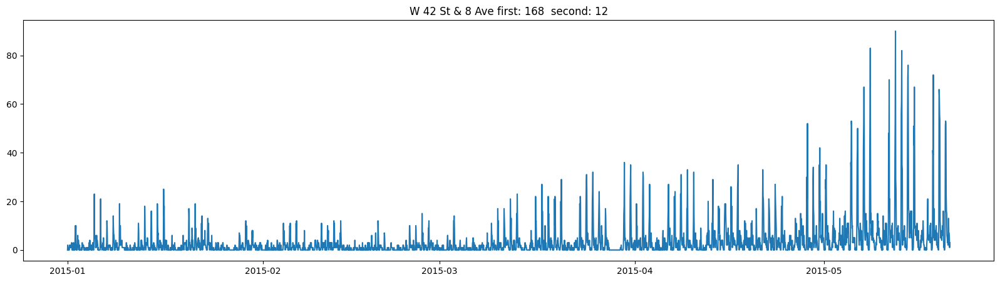

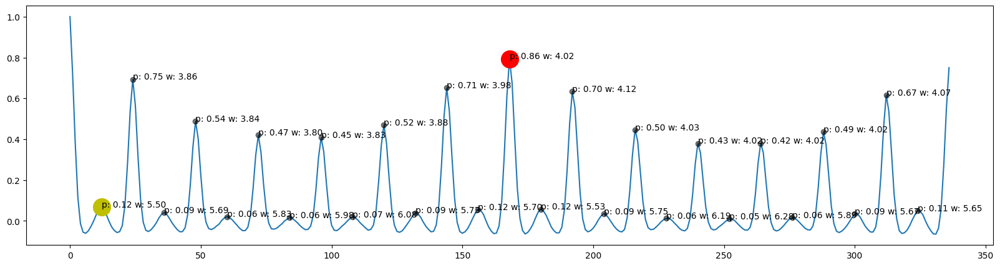

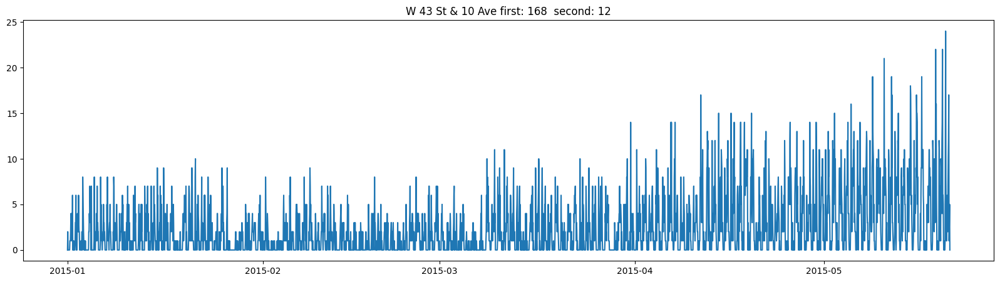

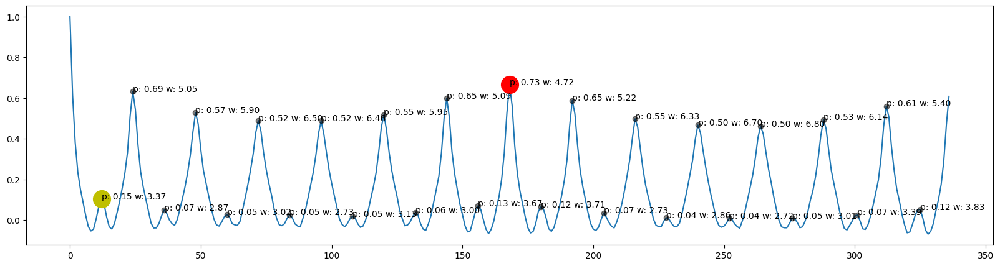

In [134]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.ticker import MultipleLocator
import numpy as np
from scipy.signal import find_peaks, peak_prominences, peak_widths


for i in interesting[:20]:
    sig, first, ac_first, second, ac_second, name = datasets[i]
    plt.figure(figsize=(20, 5))
    plt.plot(sig[:max(20 * first, 20 * second)])
    ax = plt.gca()

    plt.figure(figsize=(20, 5))
    n_lags = max(min(5000,  2 * first), second * 2)
    #n_lags = 5000
    a, b = np.quantile(sig, [0.001, 0.999])
    data_clipped = np.clip(sig, a, b)
    auto_corr = acf(data_clipped, nlags=n_lags, fft=True)
    plt.plot(auto_corr)
    peaks, _ = find_peaks(auto_corr)
    new_mine = 0
    if len(peaks):
        prominences = peak_prominences(auto_corr, peaks)[0]
        widths = peak_widths(auto_corr, peaks)[0]
        masked_inds = np.where(auto_corr[peaks] >= np.maximum.accumulate(auto_corr[peaks][::-1])[::-1])[0]
        best_masked_ind = np.argmax(prominences[masked_inds])
        best_masked = peaks[masked_inds[best_masked_ind]]
        sorted_prominences = np.sort(prominences)
        
        if len(prominences) < 2:
            good_max = sorted_prominences[-1]
        else:
            good_max = sorted_prominences[-2]
        prominence_threshold = good_max - 4 * prominences[masked_inds].std()
        #pruned_inds = masked_inds[prominences[masked_inds] > prominence_threshold]
        pruned_inds = np.where(prominences > prominence_threshold)[0]
                
        for p in pruned_inds:
            plt.text(peaks[p], auto_corr[peaks[p]], f"p: {prominences[p]:.2f} w: {widths[p]:.2f}")

        plt.plot(peaks[pruned_inds], auto_corr[peaks[pruned_inds]], 'o', c='k', alpha=0.5)
    ax.set_title(f"{name} first: {first}  second: {second}")

    plt.plot([first], auto_corr[first], 'o', c='r', markersize=20)
    plt.plot([second], auto_corr[second], 'o', c='y', markersize=20)
    #plt.plot([period], auto_corr[period], 'o', c='g')
    #plt.plot([period2], auto_corr[period2], 'o', c='b')

#    plt.title(f"prominence max: {prominences.max()}")

In [257]:
scores = {}
for f in glob("/home/amueller/winhome/Downloads/citimlsrcnn 1/citimlsrcnn/*.csv"):
    scores[f.split("/")[-1].split("_")[0]] = pd.read_csv(f)

In [258]:
all_scores = pd.concat([s['AnomalyScore'].rename(f) for f, s in scores.items()], axis=1)

<Axes: >

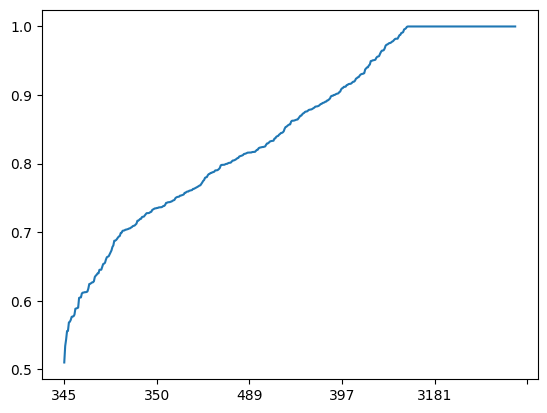

In [259]:
all_scores.max().sort_values().plot()

In [205]:
all_df.sum().sort_values()

start station id
3241        13.0
255         15.0
3242        15.0
3237       257.0
3138       274.0
          ...   
497      86108.0
435      87149.0
293      95890.0
521     100796.0
519     104813.0
Length: 488, dtype: float64

In [255]:
sums = all_df.sum()
not_noisy =  sums[sums > sums.quantile(0.50)].index

In [256]:
all_scores

,116_MlNetSrCNN,119_MlNetSrCNN,120_MlNetSrCNN,127_MlNetSrCNN,128_MlNetSrCNN,137_MlNetSrCNN,143_MlNetSrCNN,144_MlNetSrCNN,146_MlNetSrCNN,147_MlNetSrCNN,...,537_MlNetSrCNN,538_MlNetSrCNN,539_MlNetSrCNN,540_MlNetSrCNN,545_MlNetSrCNN,546_MlNetSrCNN,72_MlNetSrCNN,79_MlNetSrCNN,82_MlNetSrCNN,83_MlNetSrCNN
0,0.056339,0.076056,0.025114,0.026086,0.093589,0.064576,0.050643,0.087105,0.052702,0.019639,...,0.043905,0.043091,0.008816,0.079606,0.023161,0.026571,0.041358,0.005403,0.041830,0.034942
1,0.060629,0.042227,0.050537,0.061996,0.062804,0.027072,0.051244,0.003038,0.008143,0.068926,...,0.063648,0.025337,0.070952,0.012039,0.069724,0.049672,0.016544,0.045512,0.048242,0.059687
2,0.043985,0.014995,0.000615,0.008573,0.000528,0.016192,0.005396,0.046506,0.007408,0.020614,...,0.029580,0.054744,0.018015,0.012381,0.008568,0.075413,0.059913,0.093858,0.017586,0.006914
3,0.094810,0.015541,0.032860,0.085115,0.060469,0.026760,0.003094,0.024262,0.035042,0.026056,...,0.022424,0.003684,0.082635,0.057077,0.076594,0.065832,0.010803,0.061600,0.091534,0.005846
4,0.052049,0.068539,0.047324,0.025660,0.051639,0.045728,0.063430,0.001646,0.064139,0.004297,...,0.023357,0.011771,0.002122,0.026649,0.118269,0.086829,0.072761,0.014994,0.058163,0.013219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8760,0.033440,0.043191,0.355904,0.001162,0.000073,0.000841,0.025436,0.014262,0.014588,0.026832,...,0.139036,0.084000,0.032617,0.065367,0.029106,0.044195,0.046924,0.034658,0.062650,0.073741
8761,0.023794,0.084944,0.014538,0.040462,0.077510,0.065954,0.000822,0.037170,0.040669,0.058321,...,0.041561,0.032154,0.051821,0.032934,0.020475,0.002805,0.061385,0.008280,0.017041,0.010847
8762,0.055934,0.057836,0.013077,0.016014,0.011273,0.023453,0.039231,0.024890,0.068745,0.001951,...,0.049400,0.029557,0.062085,0.004191,0.025793,0.006266,0.083542,0.029290,0.023936,0.027313
8763,0.044718,0.043744,0.019829,0.073715,0.006719,0.080513,0.054042,0.039638,0.047327,0.064020,...,0.066519,0.227769,0.007040,0.078516,0.035763,0.062079,0.045024,0.081284,0.061005,0.048923


<Axes: >

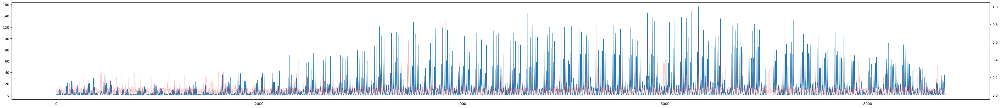

In [261]:
plt.figure(figsize=(50, 5))
all_df[519].reset_index(drop=True).plot(linewidth=1)
all_scores['519'].plot(ax=plt.twinx(), c='r', linewidth=0.1)

In [207]:
from utils import plot_detection

<Axes: ylabel='signal'>

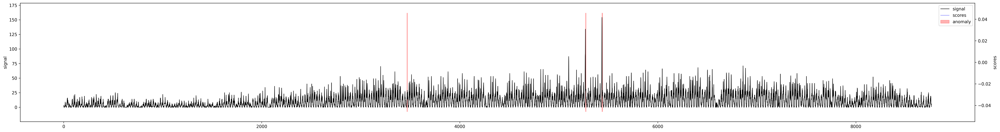

In [262]:
plot_detection(all_df[293].reset_index(drop=True), label=(all_scores['293'] > 0.7).astype(int))

In [227]:
np.where(all_scores['293_MlNetSrCNN'] > 0.7)

(array([3465, 5269, 5435, 5436]),)

<Axes: xlabel='starttime'>

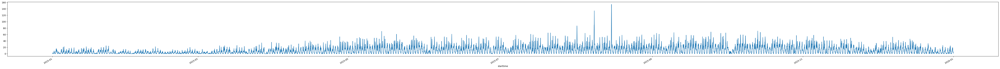

In [219]:
plt.figure(figsize=(80, 5))
all_df[293].plot()

In [292]:
np.percentile(all_scores, 99.9)

0.5924812751545505

In [265]:
all_df.shape

(8765, 488)

In [264]:
df_not_noisy = all_df[not_noisy]
df_not_noisy

start station id,72,79,116,127,137,146,147,150,151,152,...,2021,2022,2023,3002,3141,3230,128,153,294,404
starttime,,,,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,NaN,NaN,2.0,0.0,0.0,0.0
2015-01-01 01:00:00,0.0,0.0,3.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,1.0,0.0,2.0
2015-01-01 02:00:00,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,1.0,1.0
2015-01-01 03:00:00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,2.0
2015-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,1.0,2.0,4.0,5.0,2.0,3.0,7.0,1.0,2.0,3.0,...,2.0,0.0,0.0,0.0,7.0,0.0,3.0,NaN,NaN,NaN
2015-12-31 20:00:00,0.0,2.0,3.0,3.0,1.0,2.0,1.0,1.0,3.0,1.0,...,1.0,1.0,0.0,6.0,2.0,0.0,1.0,NaN,NaN,NaN
2015-12-31 21:00:00,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,2.0,0.0,...,0.0,0.0,0.0,5.0,2.0,0.0,3.0,NaN,NaN,NaN


/home/amueller/miniconda3/envs/tsb_ad/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


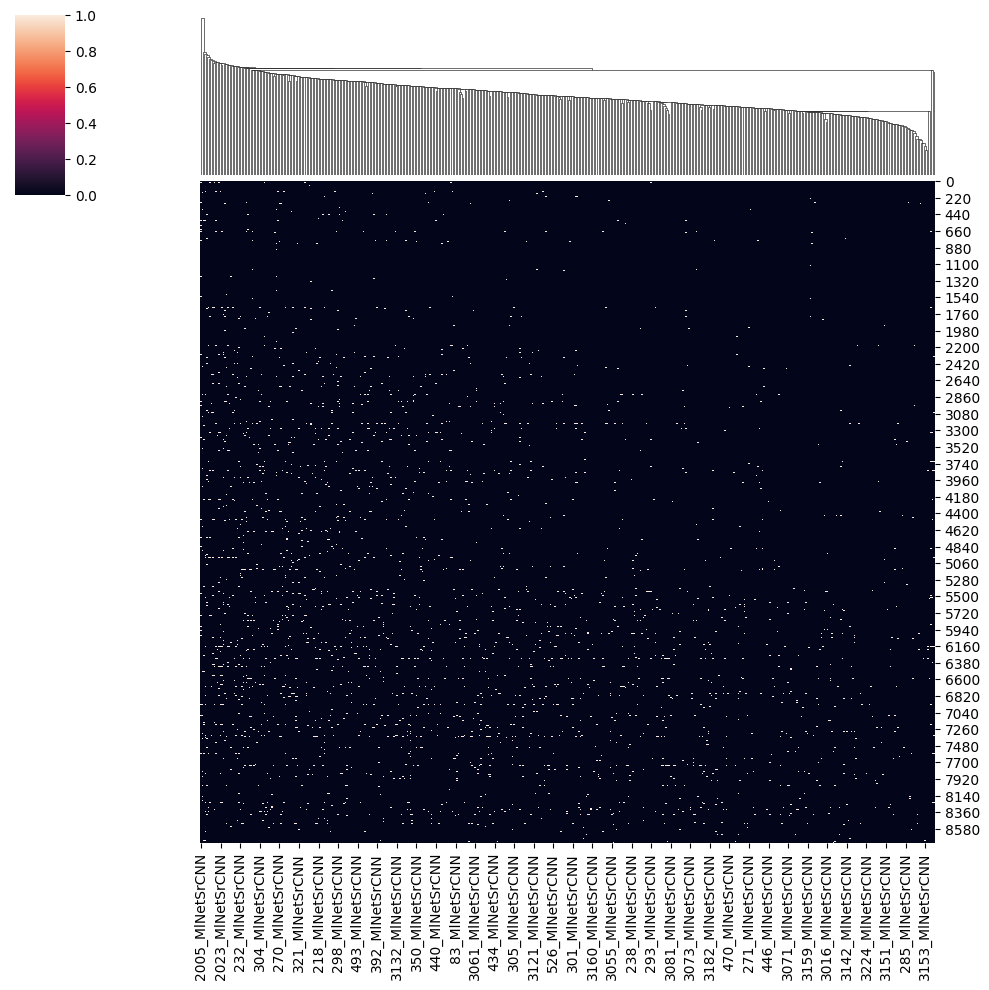

In [230]:
import seaborn as sns

sns.clustermap(all_scores > 0.3, row_cluster=False)

/home/amueller/miniconda3/envs/tsb_ad/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


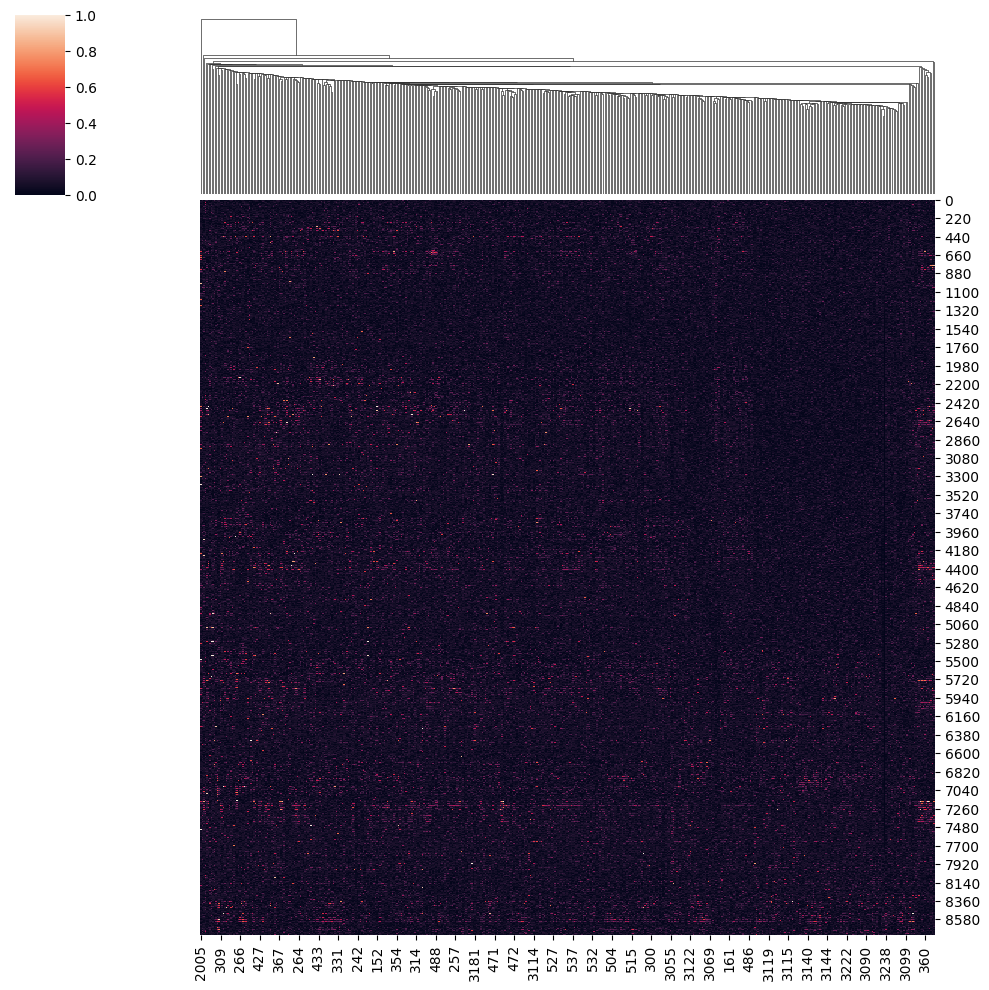

In [266]:
sns.clustermap(all_scores, row_cluster=False)

In [271]:
all_scores.columns = np.array(all_scores.columns).astype(int)

In [281]:
(all_scores[not_noisy] > 0.6).T.sum().sort_values()

5647     0
5667     0
5666     0
5665     0
5664     0
        ..
6502    12
7174    12
4544    13
7909    14
4400    15
Length: 8765, dtype: int64

In [282]:
(all_scores > 0.6).T.sum().sort_values()

5328     0
5348     0
5344     0
5343     0
5342     0
        ..
6323    16
7174    16
4400    17
7333    20
7909    21
Length: 8765, dtype: int64

In [293]:
this_ad_max = all_scores[not_noisy].loc[7333].sort_values().index[-5:]

In [294]:
this_ad_max

Index([527, 403, 302, 445, 3230], dtype='int64')

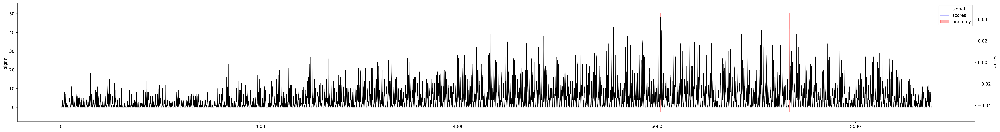

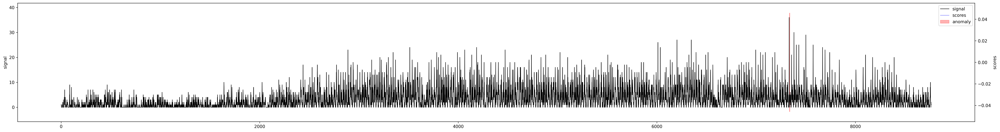

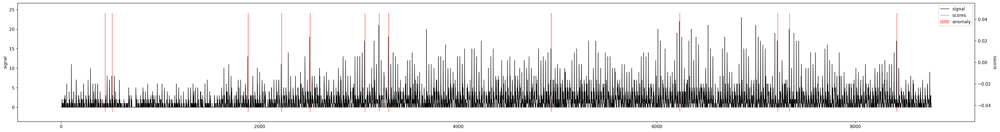

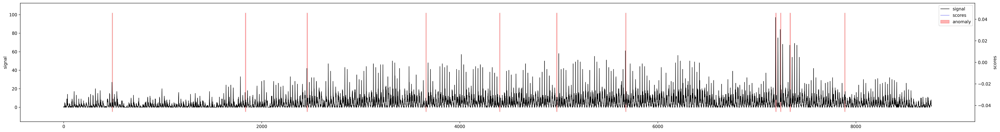

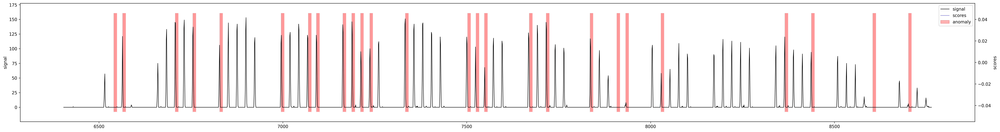

In [295]:
for station in this_ad_max:
    plot_detection(all_df[station].reset_index(drop=True), label=(all_scores[station] > 0.7).astype(int))

<Axes: xlabel='starttime'>

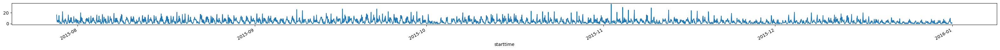

In [298]:
plt.figure(figsize=(40, 1))
all_df[403].iloc[5000:].plot()

In [303]:
all_scores[not_noisy].max().sort_values()

345     0.509930
380     0.533921
382     0.543496
116     0.555774
285     0.568438
          ...   
445     1.000000
454     1.000000
434     1.000000
441     1.000000
2023    1.000000
Length: 244, dtype: float64

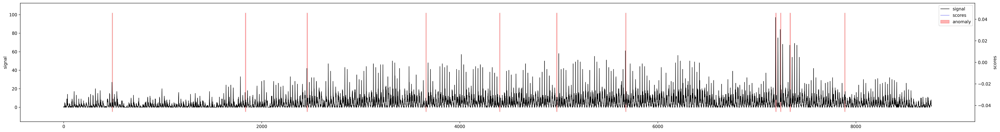

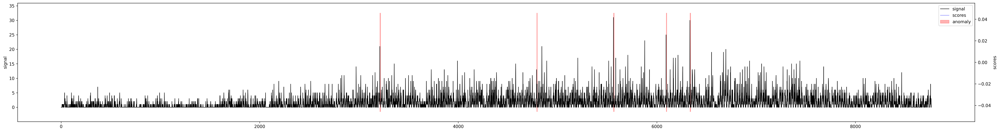

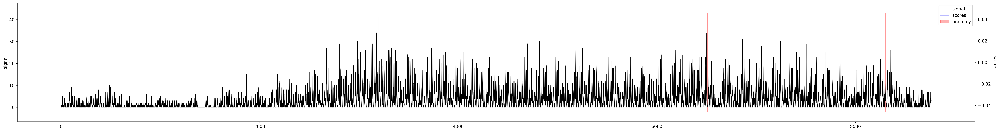

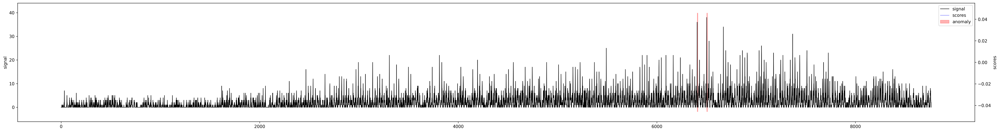

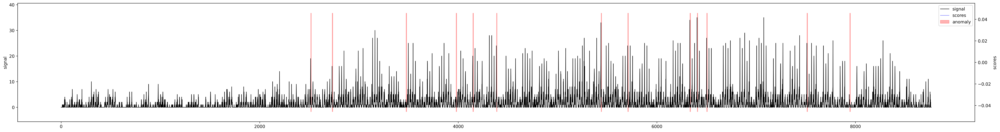

In [304]:
for station in all_scores[not_noisy].max().sort_values().index[-5:]:
    plot_detection(all_df[station].reset_index(drop=True), label=(all_scores[station] > 0.7).astype(int))